<h1>Capstone II: Tobacco use from 2011-2019</h1>

<h3>Problem Statement:</h3> 
Since the introduction of the first ever federal government backed anti-smoking campaigns in 2012, have we seen a decline in smoking/tobacco use in the United States across all demographic groups? Can we identify at least one demographic group and/or one area in the country where smoking/tobacco use hasn’t declined or stagnated and offer possible solutions?

<h2>Step 1: Import our Libraries</h2>

In [2]:
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
import matplotlib as mpl
import numpy as np
import statsmodels.api as sm

<h3>Step 2: Import our CSV file</h3>

In [3]:
df_raw = pd.read_csv("Behavioral_Risk_Factor_Data__Tobacco_Use__2011_to_present__20240516.csv")

df_raw.head()

,YEAR,LocationAbbr,LocationDesc,TopicType,TopicDesc,MeasureDesc,DataSource,Response,Data_Value_Unit,Data_Value_Type,...,GeoLocation,TopicTypeId,TopicId,MeasureId,StratificationID1,StratificationID2,StratificationID3,StratificationID4,SubMeasureID,DisplayOrder
0,2017,GU,Guam,Tobacco Use – Survey Data,Cigarette Use (Adults),Current Smoking,BRFSS,NaN,%,Percentage,...,"(13.444304, 144.793731)",BEH,100BEH,110CSA,2GEN,8AGE,6RAC,6EDU,BRF21,21
1,2018,US,National Median (States and DC),Tobacco Use – Survey Data,Cigarette Use (Adults),Smoking Status,BRFSS,Current,%,Percentage,...,NaN,BEH,100BEH,165SSA,1GEN,8AGE,6RAC,6EDU,BRF27,27
2,2017,US,National Median (States and DC),Tobacco Use – Survey Data,Cigarette Use (Adults),Smoking Status,BRFSS,Never,%,Percentage,...,NaN,BEH,100BEH,165SSA,1GEN,8AGE,6RAC,6EDU,BRF28,28
3,2016,GU,Guam,Tobacco Use – Survey Data,Smokeless Tobacco Use (Adults),Current Use,BRFSS,NaN,%,Percentage,...,"(13.444304, 144.793731)",BEH,150BEH,177SCU,1GEN,8AGE,4RAC,6EDU,BRF69,69
4,2014,GU,Guam,Tobacco Use – Survey Data,Cigarette Use (Adults),Current Smoking,BRFSS,NaN,%,Percentage,...,"(13.444304, 144.793731)",BEH,100BEH,110CSA,1GEN,8AGE,5RAC,6EDU,BRF22,22


<h2>Step 3: Clean up our data</h2>

<h4>Creating Custom columns:</h4>
We first created a version of the percentage column that we can use to calculate the portion of our population from the sample size

In [4]:
df_raw['Percentage'] = df_raw['Data_Value'] / 100

df_raw['Percentage'].head()

0    0.300
1    0.161
2    0.582
3    0.005
4    0.219
Name: Percentage, dtype: float64

 <h4>Custom Columns Pt. 2:</h4>
 We then used that percentage column and created the sampled portion column by getting the percentage of our sample size

In [5]:
df_raw['Sample_Size'] = df_raw['Sample_Size'].replace(',', '', regex=True).astype(float)

df_raw['Sampled_Portion'] = df_raw['Percentage'] * df_raw['Sample_Size']

df_raw['Sampled_Portion']

0        207.600
1            NaN
2            NaN
3          0.615
4         45.771
          ...   
43336     12.018
43337     62.167
43338    253.344
43339    322.047
43340    614.901
Name: Sampled_Portion, Length: 43341, dtype: float64

<h4>Formatting our dataframe:</h4>
Before we start our analysis, we create a cleaned up dataframe that holds our formatted percentages and looks a lot more readable. We also went ahead and created additional dataframes that hold particular sets of values that we'll see later on in our analysis.

In [6]:
df_clean = df_raw[['YEAR', 'LocationAbbr', 'LocationDesc', 'TopicDesc', 'MeasureDesc', 'Response', 'Data_Value', 'Percentage',
                  'Sampled_Portion', 'Sample_Size', 'Gender', 'Race', 'Age', 'Education']]

df_clean.columns = ['Year', 'Abbr', 'Location', 'Topic', 'Measure', 'Response', 'Data_Value', 'Percentage', 'Sampled_Portion',
                   'Sample_Size', 'Gender', 'Race', 'Age', 'Education'] 

df_clean

,Year,Abbr,Location,Topic,Measure,Response,Data_Value,Percentage,Sampled_Portion,Sample_Size,Gender,Race,Age,Education
0,2017,GU,Guam,Cigarette Use (Adults),Current Smoking,NaN,30.0,0.300,207.600,692.0,Male,All Races,All Ages,All Grades
1,2018,US,National Median (States and DC),Cigarette Use (Adults),Smoking Status,Current,16.1,0.161,NaN,NaN,Overall,All Races,All Ages,All Grades
2,2017,US,National Median (States and DC),Cigarette Use (Adults),Smoking Status,Never,58.2,0.582,NaN,NaN,Overall,All Races,All Ages,All Grades
3,2016,GU,Guam,Smokeless Tobacco Use (Adults),Current Use,NaN,0.5,0.005,0.615,123.0,Overall,Hispanic,All Ages,All Grades
4,2014,GU,Guam,Cigarette Use (Adults),Current Smoking,NaN,21.9,0.219,45.771,209.0,Overall,White,All Ages,All Grades
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
43336,2011,RI,Rhode Island,Smokeless Tobacco Use (Adults),Current Use,NaN,0.6,0.006,12.018,2003.0,Overall,All Races,65 Years and Older,All Grades
43337,2013-2014,MA,Massachusetts,Cigarette Use (Adults),Current Smoking – (2 yrs – Race/Ethnicity),NaN,8.3,0.083,62.167,749.0,Overall,Asian/Pacific Islander,All Ages,All Grades
43338,2015,AK,Alaska,Cigarette Use (Adults),Current Smoking,NaN,27.3,0.273,253.344,928.0,Overall,All Races,Age 20 and Older,12th Grade
43339,2014,IA,Iowa,Smokeless Tobacco Use (Adults),User Status,Current,9.9,0.099,322.047,3253.0,Male,All Races,All Ages,All Grades


In [7]:
df_clean_age = df_clean[df_clean['Age'].isin(["18 to 24 Years", "25 to 44 Years", "45 to 64 Years", "65 Years and Older"])]

df_clean_education = df_clean[df_clean['Education'].isin(["< 12th Grade", "> 12th Grade", "12th Grade"])]

df_race = df_clean[((df_clean['Race'].isin(["White", "African American", "Hispanic", "American Indian/Alaska Native", "Asian/Pacific Islander"]))
                    & (df_clean['Year'].isin(["2011", "2012", "2013", "2014", "2015", "2016", "2017", "2018", "2019"])))]

df_gender = df_clean[df_clean['Gender'].isin(["Male", "Female"])]

<h2>Step 4: Analysis!</h2>

<h3> General View: </h3>

<h4> Cigarette Smoking trends: </h4>

In [8]:
df_clean_current_smoking = df_clean[(df_clean['Measure'] == "Current Smoking") & (df_clean['Gender'] == "Overall") &
                                   (df_clean['Race'] == "All Races") & (df_clean['Age'] == "All Ages") & 
                                    (df_clean['Education'] == "All Grades")]

df_clean_current_smoking.groupby(['Topic', 'Year', 'Measure']).mean(numeric_only=True)

Data_Value  Percentage  \
Topic                  Year Measure                                   
Cigarette Use (Adults) 2011 Current Smoking   21.320755    0.213208   
                       2012 Current Smoking   19.807547    0.198075   
                       2013 Current Smoking   19.281132    0.192811   
                       2014 Current Smoking   18.522642    0.185226   
                       2015 Current Smoking   17.850943    0.178509   
                       2016 Current Smoking   17.488679    0.174887   
                       2017 Current Smoking   17.330189    0.173302   
                       2018 Current Smoking   16.567925    0.165679   
                       2019 Current Smoking   16.259615    0.162596   

                                             Sampled_Portion  Sample_Size  
Topic                  Year Measure                                        
Cigarette Use (Adults) 2011 Current Smoking      1971.374189  9508.018868  
                       2012 Current Smoking      1715.289321  8792.792453  
                       2013 Current Smoking      1694.101170  8989.641509  
                       2014 Current Smoking      1506.323358  8367.792453  
                       2015 Current Smoking      1380.055283  7988.056604  
                       2016 Current Smoking      1475.470340  8777.471698  
                       2017 Current Smoking      1368.269245  8137.584906  
                       2018 Current Smoking      1259.955887  7936.226415  
                       2019 Current Smoking      1206.559423  7679.615385

<h4>E-Cig and Smokeless Tobacco use trends:</h4>

In [9]:
df_clean_current_use = df_clean[(df_clean['Measure'] == "Current Use") & (df_clean['Gender'] == "Overall") &
                                   (df_clean['Race'] == "All Races") & (df_clean['Age'] == "All Ages") & 
                                    (df_clean['Education'] == "All Grades")]

df_clean_current_use.groupby(['Topic', 'Year', 'Measure']).mean(numeric_only=True)

Data_Value  Percentage  \
Topic                          Year Measure                               
E-Cigarette Use (Adults)       2016 Current Use    4.605660    0.046057   
                               2017 Current Use    4.532075    0.045321   
                               2018 Current Use    5.545455    0.055455   
Smokeless Tobacco Use (Adults) 2011 Current Use    4.372222    0.043722   
                               2012 Current Use    4.209259    0.042093   
                               2013 Current Use    4.416667    0.044167   
                               2014 Current Use    4.207407    0.042074   
                               2015 Current Use    4.385185    0.043852   
                               2016 Current Use    4.283333    0.042833   
                               2017 Current Use    4.411321    0.044113   
                               2018 Current Use    4.292453    0.042925   
                               2019 Current Use    4.332692    0.043327   

                                                 Sampled_Portion  Sample_Size  
Topic                          Year Measure                                    
E-Cigarette Use (Adults)       2016 Current Use       400.255151  8784.452830  
                               2017 Current Use       364.067943  8101.320755  
                               2018 Current Use       430.281667  7884.727273  
Smokeless Tobacco Use (Adults) 2011 Current Use       400.826057  9547.792453  
                               2012 Current Use       352.543094  8824.641509  
                               2013 Current Use       380.600679  9014.320755  
                               2014 Current Use       342.154604  8392.358491  
                               2015 Current Use       336.407113  8011.283019  
                               2016 Current Use       346.019019  8801.566038  
                               2017 Current Use       341.076755  8163.396226  
                               2018 Current Use       310.737415  7967.735849  
                               2019 Current Use       312.299654  7709.153846

<h4>Quick Analysis:</h4>
<ul>
<li>E-Cig use is trending upwards.</li>
<li>Smokeless tobacco use basically stayed stagnant.</li> 
<li>Overall, cigarette use has steadily declined.</li>
</ul>

<h3>Quick Pitstop: Creating some functions </h3>

While performing this analysis, I realized that I was basically re-writing the same code over and over again with slight modifications. Through some trial and error, along with some outside help, I was able to craft a function that could be called to quickly analyze the data through different lenses.

<h4>The Functions:</h4>

In [10]:
def custom_agg(data, measure, group_cols):
    filtered_df = data[data['Measure'] == measure]
    return(filtered_df.groupby(group_cols).mean(numeric_only=True))

def custom_agg_2(data, measure, topic, group_cols):
    filtered_df = data[data['Measure'] == measure]
    filtered_df_topic = filtered_df[filtered_df['Topic'] == topic]
    return(filtered_df_topic.groupby(group_cols).mean(numeric_only=True))

<h3> By Gender: </h3>

<h4>Cigarette Smoking Trends:</h4>

In [11]:
custom_agg(df_clean, "Current Smoking", ['Topic', 'Gender', 'Year', 'Measure'])

Data_Value  Percentage  \
Topic                  Gender  Year Measure                                   
Cigarette Use (Adults) Female  2011 Current Smoking   20.792453    0.207925   
                               2012 Current Smoking   19.309434    0.193094   
                               2013 Current Smoking   18.602830    0.186028   
                               2014 Current Smoking   17.943396    0.179434   
                               2015 Current Smoking   16.960377    0.169604   
                               2016 Current Smoking   16.459434    0.164594   
                               2017 Current Smoking   16.421698    0.164217   
                               2018 Current Smoking   15.643396    0.156434   
                               2019 Current Smoking   15.299038    0.152990   
                       Male    2011 Current Smoking   23.743396    0.237434   
                               2012 Current Smoking   22.047170    0.220472   
                               2013 Current Smoking   21.550943    0.215509   
                               2014 Current Smoking   20.552830    0.205528   
                               2015 Current Smoking   19.854717    0.198547   
                               2016 Current Smoking   19.558491    0.195585   
                               2017 Current Smoking   19.292453    0.192925   
                               2018 Current Smoking   18.354717    0.183547   
                               2019 Current Smoking   17.932692    0.179327   
                       Overall 2011 Current Smoking   23.068867    0.230689   
                               2012 Current Smoking   21.686625    0.216866   
                               2013 Current Smoking   21.186826    0.211868   
                               2014 Current Smoking   20.452375    0.204524   
                               2015 Current Smoking   19.658073    0.196581   
                               2016 Current Smoking   19.363716    0.193637   
                               2017 Current Smoking   19.414020    0.194140   
                               2018 Current Smoking   18.626441    0.186264   
                               2019 Current Smoking   18.365987    0.183660   

                                                     Sampled_Portion  \
Topic                  Gender  Year Measure                            
Cigarette Use (Adults) Female  2011 Current Smoking       696.794868   
                               2012 Current Smoking       600.250717   
                               2013 Current Smoking       579.426462   
                               2014 Current Smoking       508.361736   
                               2015 Current Smoking       454.086453   
                               2016 Current Smoking       471.756877   
                               2017 Current Smoking       435.497566   
                               2018 Current Smoking       397.260406   
                               2019 Current Smoking       380.700029   
                       Male    2011 Current Smoking       858.644887   
                               2012 Current Smoking       764.096755   
                               2013 Current Smoking       771.122604   
                               2014 Current Smoking       688.456208   
                               2015 Current Smoking       646.284075   
                               2016 Current Smoking       712.711038   
                               2017 Current Smoking       671.073340   
                               2018 Current Smoking       628.923358   
                               2019 Current Smoking       600.207846   
                       Overall 2011 Current Smoking       608.913489   
                               2012 Current Smoking       533.621046   
                               2013 Current Smoking       531.480029   
                               2014 Current Smoking       469.981705   
                               20

<h4>Smokeless/E-Cigarette Trends:</h4>

In [12]:
custom_agg(df_clean, "Current Use", ['Topic', 'Gender', 'Year', 'Measure'])

Data_Value  \
Topic                          Gender  Year Measure                   
E-Cigarette Use (Adults)       Female  2016 Current Use    4.318868   
                                       2017 Current Use    4.353774   
                                       2018 Current Use    5.621212   
                               Male    2016 Current Use    5.611321   
                                       2017 Current Use    5.537736   
                                       2018 Current Use    6.872727   
                               Overall 2016 Current Use    4.749313   
                                       2017 Current Use    4.714268   
                                       2018 Current Use    5.646964   
Smokeless Tobacco Use (Adults) Female  2011 Current Use    1.118868   
                                       2012 Current Use    1.133962   
                                       2013 Current Use    1.174528   
                                       2014 Current Use    1.161321   
                                       2015 Current Use    1.105660   
                                       2016 Current Use    1.171698   
                                       2017 Current Use    1.266981   
                                       2018 Current Use    1.242453   
                                       2019 Current Use    1.278846   
                               Male    2011 Current Use    7.888679   
                                       2012 Current Use    7.584906   
                                       2013 Current Use    7.900000   
                                       2014 Current Use    7.473585   
                                       2015 Current Use    7.875472   
                                       2016 Current Use    7.647170   
                                       2017 Current Use    7.784906   
                                       2018 Current Use    7.552830   
                                       2019 Current Use    7.625000   
                               Overall 2011 Current Use    4.432469   
                                       2012 Current Use    4.347955   
                                       2013 Current Use    4.399122   
                                       2014 Current Use    4.213483   
                                       2015 Current Use    4.387375   
                                       2016 Current Use    4.428269   
                                       2017 Current Use    4.504213   
                                       2018 Current Use    4.404261   
                                       2019 Current Use    4.547389   

                                                         Percentage  \
Topic                          Gender  Year Measure                   
E-Cigarette Use (Adults)       Female  2016 Current Use    0.043189   
                                       2017 Current Use    0.043538   
                                       2018 Current Use    0.056212   
                               Male    2016 Current Use    0.056113   
                                       2017 Current Use    0.055377   
                                       2018 Current Use    0.068727   
                               Overall 2016 Current Use    0.047493   
                                       2017 Current Use    0.047143   
                                       2018 Current Use    0.056470   
Smokeless Tobacco Use (Adults) Female  2011 Current Use    0.011189   
                                       2012 Current Use    0.011340   
                                       2013 Current Use    0.011745   
                                       2014 Current Use    0.011613   
                                       2015 Current Use    0.011057   
                                       2016 Current Use    0.011717   
                                       2017 Current Use    0.012670   
                                       2018 Current Use    0.012425   
         

<h4>Quick Analysis:</h4>
<ul>
<li>The cigarette smoking decline still seems fairly steady and proportional across genders.</li> 
<li>The upward trend of e-cig use is fairly proportional for both men and women.</li>
<li>Men are clearly making up the majority of smokeless tobacco use.</li>
</ul>

<h3> By Race: </h3>

<h4>Cigarette Use:</h4>

In [13]:
custom_agg(df_clean, "Current Smoking", ['Topic', 'Race', 'Year', 'Measure'])

Data_Value  \
Topic                  Race                          Year Measure                       
Cigarette Use (Adults) African American              2011 Current Smoking   25.592683   
                                                     2012 Current Smoking   22.635714   
                                                     2013 Current Smoking   22.250000   
                                                     2014 Current Smoking   21.723810   
                                                     2015 Current Smoking   21.935714   
                                                     2016 Current Smoking   19.819512   
                                                     2017 Current Smoking   20.025581   
                                                     2018 Current Smoking   18.300000   
                                                     2019 Current Smoking   18.035714   
                       All Races                     2011 Current Smoking   22.964016   
                                                     2012 Current Smoking   21.569677   
                                                     2013 Current Smoking   20.923450   
                                                     2014 Current Smoking   20.337871   
                                                     2015 Current Smoking   19.503100   
                                                     2016 Current Smoking   19.260377   
                                                     2017 Current Smoking   19.155930   
                                                     2018 Current Smoking   18.397844   
                                                     2019 Current Smoking   18.110440   
                       American Indian/Alaska Native 2011 Current Smoking   33.250000   
                                                     2012 Current Smoking   35.414706   
                                                     2013 Current Smoking   35.451351   
                                                     2014 Current Smoking   32.582353   
                                                     2015 Current Smoking   31.942857   
                                                     2016 Current Smoking   31.630556   
                                                     2017 Current Smoking   31.327500   
                                                     2018 Current Smoking   31.157143   
                                                     2019 Current Smoking   31.488889   
                       Asian/Pacific Islander        2011 Current Smoking   13.183784   
                                                     2012 Current Smoking   10.513889   
                                                     2013 Current Smoking   10.321212   
                                                     2014 Current Smoking   10.252632   
                                                     2015 Current Smoking    9.440541   
                                                     2016 Current Smoking    8.755263   
                                                     2017 Current Smoking   10.594595   
                                                     2018 Current Smoking   10.217647   
                                                     2019 Current Smoking    9.214706   
                       Hispanic                      2011 Current Smoking   21.077358   
                                                     2012 Current Smoking   19.160377   
                                                     2013 Current Smoking   18.251923   
                                                     2014 Current Smoking   17.786275   
                                                     2015 Current Smoking   15.972000   
                                                     2016 Current Smoking   16.067308   
                                                     2017 Current Smoking   15.898039   
                                                     2018 Current Smok

<h4>Smokeless Tobacco Use:</h4>

In [14]:
custom_agg_2(df_clean, "Current Use", "Smokeless Tobacco Use (Adults)", ['Topic', 'Race', 'Year', 'Measure'])

Data_Value  \
Topic                          Race                          Year Measure                   
Smokeless Tobacco Use (Adults) African American              2011 Current Use    2.341463   
                                                             2012 Current Use    2.228571   
                                                             2013 Current Use    2.352500   
                                                             2014 Current Use    2.392857   
                                                             2015 Current Use    2.535714   
                                                             2016 Current Use    2.643902   
                                                             2017 Current Use    2.590698   
                                                             2018 Current Use    2.225581   
                                                             2019 Current Use    2.385714   
                               All Races                     2011 Current Use    4.289233   
                                                             2012 Current Use    4.246299   
                                                             2013 Current Use    4.356662   
                                                             2014 Current Use    4.154374   
                                                             2015 Current Use    4.309825   
                                                             2016 Current Use    4.299327   
                                                             2017 Current Use    4.436927   
                                                             2018 Current Use    4.333154   
                                                             2019 Current Use    4.444918   
                               American Indian/Alaska Native 2011 Current Use    1.861111   
                                                             2012 Current Use    2.436111   
                                                             2013 Current Use    6.138889   
                                                             2014 Current Use    6.844118   
                                                             2015 Current Use    6.802857   
                                                             2016 Current Use    7.411111   
                                                             2017 Current Use    6.039024   
                                                             2018 Current Use    6.254286   
                                                             2019 Current Use    6.558333   
                               Asian/Pacific Islander        2011 Current Use    7.967442   
                                                             2012 Current Use    6.337500   
                                                             2013 Current Use    2.369697   
                                                             2014 Current Use    2.357895   
                                                             2015 Current Use    2.794595   
                                                             2016 Current Use    2.571053   
                                                             2017 Current Use    3.213514   
                                                             2018 Current Use    3.200000   
                                                             2019 Current Use    3.085294   
                               Hispanic                      2011 Current Use    3.698113   
                                                             2012 Current Use    3.792453   
                                                             2013 Current Use    3.215385   
                                                             2014 Current Use    2.900000   
                                                             2015 Current Use    3.006000   
                                                             2016 Current Use   

<h4>E-Cigarette Use:</h4>

In [15]:
custom_agg_2(df_clean, "Current Use", "E-Cigarette Use (Adults)", ['Topic', 'Race', 'Year', 'Measure'])

Data_Value  \
Topic                    Race                          Year Measure                   
E-Cigarette Use (Adults) African American              2016 Current Use    3.751220   
                                                       2017 Current Use    3.425581   
                                                       2018 Current Use    4.012000   
                         All Races                     2016 Current Use    4.740970   
                                                       2017 Current Use    4.681806   
                                                       2018 Current Use    5.804329   
                         American Indian/Alaska Native 2016 Current Use    7.577143   
                                                       2017 Current Use    7.147500   
                                                       2018 Current Use    7.280952   
                         Asian/Pacific Islander        2016 Current Use    3.850000   
                                                       2017 Current Use    4.102703   
                                                       2018 Current Use    4.585000   
                         Hispanic                      2016 Current Use    4.253846   
                                                       2017 Current Use    4.900000   
                                                       2018 Current Use    5.459375   
                         White                         2016 Current Use    4.905769   
                                                       2017 Current Use    4.728846   
                                                       2018 Current Use    5.642424   

                                                                         Percentage  \
Topic                    Race                          Year Measure                   
E-Cigarette Use (Adults) African American              2016 Current Use    0.037512   
                                                       2017 Current Use    0.034256   
                                                       2018 Current Use    0.040120   
                         All Races                     2016 Current Use    0.047410   
                                                       2017 Current Use    0.046818   
                                                       2018 Current Use    0.058043   
                         American Indian/Alaska Native 2016 Current Use    0.075771   
                                                       2017 Current Use    0.071475   
                                                       2018 Current Use    0.072810   
                         Asian/Pacific Islander        2016 Current Use    0.038500   
                                                       2017 Current Use    0.041027   
                                                       2018 Current Use    0.045850   
                         Hispanic                      2016 Current Use    0.042538   
                                                       2017 Current Use    0.049000   
                                                       2018 Current Use    0.054594   
                         White                         2016 Current Use    0.049058   
                                                       2017 Current Use    0.047288   
                                                       2018 Current Use    0.056424   

                                                                         Sampled_Portion  \
Topic                    Race                          Year Measure                        
E-Cigarette Use (Adults) African American              2016 Current Use        29.158683   
                                                       2017 Current Use        23.631163   
                                                       2018 Current Use        29.240640   
                         All Races                     2016 Current Use       131.059204   
                                       

<h4>Quick Analysis:</h4>
<ul>
<li>American Indian/Alaskan Native cigarette use has basically been stagnant (the first group we haven't seen the same steady decline in so far).</li> 
<li>Smokeless tobacco use seems fairly stagnant, except for our American Indian/Alaskan Native group that has actually seen a spike from 1.8% to 6.5%.</li>
<li>E-cigarette use repeats the same upward trend across all groups. </li>
</ul>

<h3> By Age: </h3>

<h4>Cigarette Use:</h4>

In [16]:
custom_agg(df_clean_age, "Current Smoking", ['Topic', 'Age', 'Year', 'Measure'])

Data_Value  \
Topic                  Age                Year Measure                       
Cigarette Use (Adults) 18 to 24 Years     2011 Current Smoking   23.784906   
                                          2012 Current Smoking   21.226415   
                                          2013 Current Smoking   20.233962   
                                          2014 Current Smoking   18.039623   
                                          2015 Current Smoking   16.783019   
                                          2016 Current Smoking   15.183019   
                                          2017 Current Smoking   13.983019   
                                          2018 Current Smoking   12.720755   
                                          2019 Current Smoking   11.621154   
                       25 to 44 Years     2011 Current Smoking   26.250943   
                                          2012 Current Smoking   24.433962   
                                          2013 Current Smoking   23.564151   
                                          2014 Current Smoking   23.264151   
                                          2015 Current Smoking   21.937736   
                                          2016 Current Smoking   21.803774   
                                          2017 Current Smoking   22.113208   
                                          2018 Current Smoking   20.903774   
                                          2019 Current Smoking   20.769231   
                       45 to 64 Years     2011 Current Smoking   21.860377   
                                          2012 Current Smoking   20.930189   
                                          2013 Current Smoking   20.528302   
                                          2014 Current Smoking   19.641509   
                                          2015 Current Smoking   19.479245   
                                          2016 Current Smoking   19.403774   
                                          2017 Current Smoking   19.028302   
                                          2018 Current Smoking   18.477358   
                                          2019 Current Smoking   18.242308   
                       65 Years and Older 2011 Current Smoking    9.356604   
                                          2012 Current Smoking    8.990566   
                                          2013 Current Smoking    9.026415   
                                          2014 Current Smoking    8.977358   
                                          2015 Current Smoking    9.028302   
                                          2016 Current Smoking    8.903774   
                                          2017 Current Smoking    9.207547   
                                          2018 Current Smoking    9.415094   
                                          2019 Current Smoking    9.230769   

                                                                Percentage  \
Topic                  Age                Year Measure                       
Cigarette Use (Adults) 18 to 24 Years     2011 Current Smoking    0.237849   
                                          2012 Current Smoking    0.212264   
                                          2013 Current Smoking    0.202340   
                                          2014 Current Smoking    0.180396   
                                          2015 Current Smoking    0.167830   
                                          2016 Current Smoking    0.151830   
                                          2017 Current Smoking    0.139830   
                                          2018 Current Smoking    0.127208   
                                          2019 Current Smoking    0.116212   
                       25 to 44 Years     2011 Current Smoking    0.262509   
                                          2012 Current Smoking    0.244340   
                                          2013 Current Smoking    0.235642   
       

<h4>Smokeless Tobacco Use:</h4>

In [17]:
custom_agg_2(df_clean_age, "Current Use", "Smokeless Tobacco Use (Adults)", ['Topic', 'Age', 'Year', 'Measure'])

Data_Value  \
Topic                          Age                Year Measure                   
Smokeless Tobacco Use (Adults) 18 to 24 Years     2011 Current Use    6.358491   
                                                  2012 Current Use    5.992453   
                                                  2013 Current Use    6.658491   
                                                  2014 Current Use    6.277358   
                                                  2015 Current Use    6.467925   
                                                  2016 Current Use    5.905660   
                                                  2017 Current Use    5.809434   
                                                  2018 Current Use    5.466038   
                                                  2019 Current Use    5.536538   
                               25 to 44 Years     2011 Current Use    5.873585   
                                                  2012 Current Use    5.622642   
                                                  2013 Current Use    5.588679   
                                                  2014 Current Use    5.239623   
                                                  2015 Current Use    5.532075   
                                                  2016 Current Use    5.577358   
                                                  2017 Current Use    5.696226   
                                                  2018 Current Use    5.403774   
                                                  2019 Current Use    5.625000   
                               45 to 64 Years     2011 Current Use    3.320755   
                                                  2012 Current Use    3.388679   
                                                  2013 Current Use    3.775472   
                                                  2014 Current Use    3.645283   
                                                  2015 Current Use    3.875472   
                                                  2016 Current Use    3.758491   
                                                  2017 Current Use    3.992453   
                                                  2018 Current Use    4.105660   
                                                  2019 Current Use    3.936538   
                               65 Years and Older 2011 Current Use    2.092453   
                                                  2012 Current Use    2.037736   
                                                  2013 Current Use    1.958491   
                                                  2014 Current Use    2.098113   
                                                  2015 Current Use    2.049057   
                                                  2016 Current Use    2.056604   
                                                  2017 Current Use    2.201887   
                                                  2018 Current Use    2.141509   
                                                  2019 Current Use    2.221154   

                                                                    Percentage  \
Topic                          Age                Year Measure                   
Smokeless Tobacco Use (Adults) 18 to 24 Years     2011 Current Use    0.063585   
                                                  2012 Current Use    0.059925   
                                                  2013 Current Use    0.066585   
                                                  2014 Current Use    0.062774   
                                                  2015 Current Use    0.064679   
                                                  2016 Current Use    0.059057   
                                                  2017 Current Use    0.058094   
                                                  2018 Current Use    0.054660   
                                                  2019 Current Use    0.055365   
                               25 to 44 Years    

<h4>E-Cigarette Use:</h4>

In [18]:
custom_agg_2(df_clean_age, "Current Use", "E-Cigarette Use (Adults)", ['Topic', 'Age', 'Year', 'Measure'])

Data_Value  \
Topic                    Age                Year Measure                   
E-Cigarette Use (Adults) 18 to 24 Years     2016 Current Use    9.645283   
                                            2017 Current Use   10.607547   
                                            2018 Current Use   15.709091   
                         25 to 44 Years     2016 Current Use    5.943396   
                                            2017 Current Use    5.905660   
                                            2018 Current Use    7.281818   
                         45 to 64 Years     2016 Current Use    3.503774   
                                            2017 Current Use    3.077358   
                                            2018 Current Use    3.218182   
                         65 Years and Older 2016 Current Use    1.016981   
                                            2017 Current Use    0.954717   
                                            2018 Current Use    1.015152   

                                                              Percentage  \
Topic                    Age                Year Measure                   
E-Cigarette Use (Adults) 18 to 24 Years     2016 Current Use    0.096453   
                                            2017 Current Use    0.106075   
                                            2018 Current Use    0.157091   
                         25 to 44 Years     2016 Current Use    0.059434   
                                            2017 Current Use    0.059057   
                                            2018 Current Use    0.072818   
                         45 to 64 Years     2016 Current Use    0.035038   
                                            2017 Current Use    0.030774   
                                            2018 Current Use    0.032182   
                         65 Years and Older 2016 Current Use    0.010170   
                                            2017 Current Use    0.009547   
                                            2018 Current Use    0.010152   

                                                              Sampled_Portion  \
Topic                    Age                Year Measure                        
E-Cigarette Use (Adults) 18 to 24 Years     2016 Current Use        45.879453   
                                            2017 Current Use        48.967321   
                                            2018 Current Use        67.502061   
                         25 to 44 Years     2016 Current Use       107.262000   
                                            2017 Current Use       102.531094   
                                            2018 Current Use       121.716061   
                         45 to 64 Years     2016 Current Use       117.360585   
                                            2017 Current Use        93.611057   
                                            2018 Current Use        92.351970   
                         65 Years and Older 2016 Current Use        33.814660   
                                            2017 Current Use        28.908792   
                                            2018 Current Use        28.705758   

                                                              Sample_Size  
Topic                    Age                Year Measure                   
E-Cigarette Use (Adults) 18 to 24 Years     2016 Current Use   477.301887  
                                            2017 Current Use   468.867925  
                                            2018 Current Use   434.818182  
                         25 to 44 Years     2016 Current Use  1857.075472  
                                            2017 Current Use  1775.452830  
                                            2018 Current Use  1701.121212  
                         45 to 64 Years     2016 Current Use  3332.226415  
                                            2017 Current Use  2998.679245  
                                     

<h4>Quick Analysis:</h4>
<ul>
<li>Cigarette use seems to stay relatively flat among 65+ age group. Other groups use looks to be declining.</li>
<li>Smokeless tobacco use seems to be relatively flat among all age groups.</li>
<li>E-Cigarette use either flat or on the rise for all age groups.</li>
</ul>

<h3> By State: </h3>

<h4>Cigarette Use:</h4>

In [19]:
pd.set_option('display.max_rows', None)
custom_agg(df_clean, "Current Smoking", ['Topic', 'Location', 'Year', 'Measure'])

Data_Value  \
Topic                  Location             Year Measure                       
Cigarette Use (Adults) Alabama              2011 Current Smoking   26.755556   
                                            2012 Current Smoking   25.150000   
                                            2013 Current Smoking   22.633333   
                                            2014 Current Smoking   22.605556   
                                            2015 Current Smoking   23.294444   
                                            2016 Current Smoking   23.200000   
                                            2017 Current Smoking   23.438889   
                                            2018 Current Smoking   21.433333   
                                            2019 Current Smoking   22.305556   
                       Alaska               2011 Current Smoking   25.350000   
                                            2012 Current Smoking   22.973684   
                                            2013 Current Smoking   26.384211   
                                            2014 Current Smoking   21.294737   
                                            2015 Current Smoking   22.184211   
                                            2016 Current Smoking   22.450000   
                                            2017 Current Smoking   23.183333   
                                            2018 Current Smoking   22.405556   
                                            2019 Current Smoking   20.638889   
                       Arizona              2011 Current Smoking   19.984211   
                                            2012 Current Smoking   17.321053   
                                            2013 Current Smoking   17.250000   
                                            2014 Current Smoking   16.794737   
                                            2015 Current Smoking   14.273684   
                                            2016 Current Smoking   15.505263   
                                            2017 Current Smoking   15.763158   
                                            2018 Current Smoking   14.947368   
                                            2019 Current Smoking   15.810526   
                       Arkansas             2011 Current Smoking   27.438889   
                                            2012 Current Smoking   26.366667   
                                            2013 Current Smoking   26.522222   
                                            2014 Current Smoking   25.666667   
                                            2015 Current Smoking   26.644444   
                                            2016 Current Smoking   25.466667   
                                            2017 Current Smoking   24.416667   
                                            2018 Current Smoking   24.338889   
                                            2019 Current Smoking   21.033333   
                       California           2011 Current Smoking   14.352632   
                                            2012 Current Smoking   13.715789   
                                            2013 Current Smoking   13.121053   
                                            2014 Current Smoking   13.984211   
                                            2015 Current Smoking   12.273684   
                                            2016 Current Smoking   11.447368   
                                            2017 Current Smoking   11.826316   
                                            2018 Current Smoking   12.031579   
                                            2019 Current Smoking   11.294737   
                       Colorado             2011 Current Smoking   19.521053   
                                            2012 Current Smoking   20.557895   
                                            2013 Current Smoking   20.447368   
                                            2014 Current Smoking  

<h4>Smokeless Tobacco Use:</h4>

In [20]:
pd.set_option('display.max_rows', None)
custom_agg_2(df_clean, "Current Use", "Smokeless Tobacco Use (Adults)", ['Topic', 'Location', 'Year', 'Measure'])

Data_Value  \
Topic                          Location                        Year Measure                   
Smokeless Tobacco Use (Adults) Alabama                         2011 Current Use    7.011111   
                                                               2012 Current Use    5.605556   
                                                               2013 Current Use    5.722222   
                                                               2014 Current Use    5.666667   
                                                               2015 Current Use    6.100000   
                                                               2016 Current Use    5.816667   
                                                               2017 Current Use    6.338889   
                                                               2018 Current Use    6.155556   
                                                               2019 Current Use    6.294444   
                               Alaska                          2011 Current Use    5.366667   
                                                               2012 Current Use    6.115789   
                                                               2013 Current Use    6.710526   
                                                               2014 Current Use    5.073684   
                                                               2015 Current Use    6.989474   
                                                               2016 Current Use    7.533333   
                                                               2017 Current Use    7.761111   
                                                               2018 Current Use    6.483333   
                                                               2019 Current Use    8.194444   
                               Arizona                         2011 Current Use    2.842105   
                                                               2012 Current Use    3.073684   
                                                               2013 Current Use    3.355556   
                                                               2014 Current Use    3.089474   
                                                               2015 Current Use    2.605263   
                                                               2016 Current Use    2.678947   
                                                               2017 Current Use    2.705263   
                                                               2018 Current Use    2.778947   
                                                               2019 Current Use    3.478947   
                               Arkansas                        2011 Current Use    6.366667   
                                                               2012 Current Use    7.027778   
                                                               2013 Current Use    6.405556   
                                                               2014 Current Use    5.911111   
                                                               2015 Current Use    4.955556   
                                                               2016 Current Use    7.077778   
                                                               2017 Current Use    5.816667   
                                                               2018 Current Use    6.094444   
                                                               2019 Current Use    5.394444   
                               California                      2011 Current Use    1.363158   
                                                               2012 Current Use    1.410526   
                                                               2013 Current Use    1.500000   
                                                               2014 Current Use    1.536842   
                                                               2015 Current Use    1.594737

<h4>E-Cigarette Use:</h4>

In [21]:
pd.set_option('display.max_rows', None)
custom_agg_2(df_clean, "Current Use", "E-Cigarette Use (Adults)", ['Topic', 'Location', 'Year', 'Measure'])

Data_Value  \
Topic                    Location             Year Measure                   
E-Cigarette Use (Adults) Alabama              2016 Current Use    5.177778   
                                              2017 Current Use    5.055556   
                         Alaska               2016 Current Use    4.844444   
                                              2017 Current Use    3.650000   
                                              2018 Current Use    5.894444   
                         Arizona              2016 Current Use    5.100000   
                                              2017 Current Use    5.094737   
                         Arkansas             2016 Current Use    5.361111   
                                              2017 Current Use    4.905556   
                                              2018 Current Use    6.538889   
                         California           2016 Current Use    2.863158   
                                              2017 Current Use    2.800000   
                         Colorado             2016 Current Use    5.489474   
                                              2017 Current Use    5.378947   
                         Connecticut          2016 Current Use    4.177778   
                                              2017 Current Use    2.955556   
                                              2018 Current Use    5.366667   
                         Delaware             2016 Current Use    3.750000   
                                              2017 Current Use    4.900000   
                                              2018 Current Use    4.883333   
                         District of Columbia 2016 Current Use    2.194444   
                                              2017 Current Use    2.161111   
                         Florida              2016 Current Use    4.578947   
                                              2017 Current Use    4.342105   
                                              2018 Current Use    6.236842   
                         Georgia              2016 Current Use    4.572222   
                                              2017 Current Use    4.705263   
                                              2018 Current Use    5.052632   
                         Guam                 2016 Current Use    7.482353   
                                              2017 Current Use    5.905882   
                                              2018 Current Use    5.400000   
                         Hawaii               2016 Current Use    4.416667   
                                              2017 Current Use    4.922222   
                                              2018 Current Use    7.733333   
                         Idaho                2016 Current Use    4.623529   
                                              2017 Current Use    4.837500   
                                              2018 Current Use    6.293750   
                         Illinois             2016 Current Use    4.016667   
                                              2017 Current Use    4.288889   
                         Indiana              2016 Current Use    5.121053   
                                              2017 Current Use    6.152632   
                                              2018 Current Use    6.747368   
                         Iowa                 2016 Current Use    4.205556   
                                              2017 Current Use    4.200000   
                                              2018 Current Use    5.405556   
                         Kansas               2016 Current Use    5.131579   
                                              2017 Current Use    4.973684   
                         Kentucky             2016 Current Use    5.800000   
                                              2017 Current Use    6.977778   
                         Louisiana            2016 Current Use    6.100000   
        

<h4>Quick Analysis:</h4>
<ul>
    <li>Locations with an increasing cigarette use trend include: <b>None</b>. All states look to generally be on the decline with regard to cigarette use. </li>
    <li>Locations with an increasing smokeless tobacco use trend include: Alaska, Arizona, Delaware, Guam, Idaho, Indiana, Iowa, Kentucky, Louisiana, Massachusetts, Montana, South Carolina, Tennessee. There were also a few states with a higher percentage of smokeless tobacco use that also stayed relatively flat like Wyoming and West Virginia.</li>
    <li>Locations with an increasing e-cigarette use trend include: Alaska, Arkansas, Conneticut, Delaware, Florida, Georgia, Hawaii, Idaho, Indiana, Iowa, Kentucky, Maryland, Minnesota, Mississippi, Montana, New Jersey, New York, North Dakota, Oklahoma, Oregon, Rhode Island, South Dakota, Utah, West Virginia, Wyoming. That is just about half of the locations we have data for - a very staggering number indeed!</li>
</ul>

<h3> By Education: </h3>

<h4>Cigarette Use:</h4>

In [22]:
custom_agg(df_clean_education, "Current Smoking", ['Topic', 'Education', 'Year', 'Measure'])

Data_Value  \
Topic                  Education    Year Measure                       
Cigarette Use (Adults) 12th Grade   2011 Current Smoking   26.371698   
                                    2012 Current Smoking   24.755660   
                                    2013 Current Smoking   24.312264   
                                    2014 Current Smoking   23.850000   
                                    2015 Current Smoking   23.238679   
                                    2016 Current Smoking   23.218868   
                                    2017 Current Smoking   23.047170   
                                    2018 Current Smoking   22.303774   
                                    2019 Current Smoking   22.303846   
                       < 12th Grade 2011 Current Smoking   34.998113   
                                    2012 Current Smoking   33.702830   
                                    2013 Current Smoking   32.349057   
                                    2014 Current Smoking   32.728302   
                                    2015 Current Smoking   30.810377   
                                    2016 Current Smoking   31.302830   
                                    2017 Current Smoking   31.477358   
                                    2018 Current Smoking   30.364151   
                                    2019 Current Smoking   30.198077   
                       > 12th Grade 2011 Current Smoking   15.427358   
                                    2012 Current Smoking   14.501887   
                                    2013 Current Smoking   14.107547   
                                    2014 Current Smoking   13.344340   
                                    2015 Current Smoking   13.045283   
                                    2016 Current Smoking   12.670755   
                                    2017 Current Smoking   12.667925   
                                    2018 Current Smoking   12.253774   
                                    2019 Current Smoking   11.944231   

                                                          Percentage  \
Topic                  Education    Year Measure                       
Cigarette Use (Adults) 12th Grade   2011 Current Smoking    0.263717   
                                    2012 Current Smoking    0.247557   
                                    2013 Current Smoking    0.243123   
                                    2014 Current Smoking    0.238500   
                                    2015 Current Smoking    0.232387   
                                    2016 Current Smoking    0.232189   
                                    2017 Current Smoking    0.230472   
                                    2018 Current Smoking    0.223038   
                                    2019 Current Smoking    0.223038   
                       < 12th Grade 2011 Current Smoking    0.349981   
                                    2012 Current Smoking    0.337028   
                                    2013 Current Smoking    0.323491   
                                    2014 Current Smoking    0.327283   
                                    2015 Current Smoking    0.308104   
                                    2016 Current Smoking    0.313028   
                                    2017 Current Smoking    0.314774   
                                    2018 Current Smoking    0.303642   
                                    2019 Current Smoking    0.301981   
                       > 12th Grade 2011 Current Smoking    0.154274   
                                    2012 Current Smoking    0.145019   
                                    2013 Current Smoking    0.141075   
                                    2014 Current Smoking    0.133443   
                                    2015 Current Smoking    0.130453   
                                    2016 Current Smoking    0.126708   
                                    2017 Current Smoking    0.126679   
                         

<h4>Smokeless Tobacco Use:</h4>

In [23]:
custom_agg_2(df_clean_education, "Current Use", "Smokeless Tobacco Use (Adults)", ['Topic', 'Education', 'Year', 'Measure'])

Data_Value  \
Topic                          Education    Year Measure                   
Smokeless Tobacco Use (Adults) 12th Grade   2011 Current Use    5.200000   
                                            2012 Current Use    5.363208   
                                            2013 Current Use    5.363208   
                                            2014 Current Use    5.081132   
                                            2015 Current Use    5.291509   
                                            2016 Current Use    5.305660   
                                            2017 Current Use    5.541509   
                                            2018 Current Use    5.376415   
                                            2019 Current Use    5.675000   
                               < 12th Grade 2011 Current Use    5.471698   
                                            2012 Current Use    5.519811   
                                            2013 Current Use    5.519811   
                                            2014 Current Use    5.144340   
                                            2015 Current Use    5.243396   
                                            2016 Current Use    5.702830   
                                            2017 Current Use    5.961321   
                                            2018 Current Use    6.010377   
                                            2019 Current Use    6.332692   
                               > 12th Grade 2011 Current Use    3.280189   
                                            2012 Current Use    3.289623   
                                            2013 Current Use    3.289623   
                                            2014 Current Use    3.222642   
                                            2015 Current Use    3.434906   
                                            2016 Current Use    3.300943   
                                            2017 Current Use    3.340566   
                                            2018 Current Use    3.221698   
                                            2019 Current Use    3.189423   

                                                              Percentage  \
Topic                          Education    Year Measure                   
Smokeless Tobacco Use (Adults) 12th Grade   2011 Current Use    0.052000   
                                            2012 Current Use    0.053632   
                                            2013 Current Use    0.053632   
                                            2014 Current Use    0.050811   
                                            2015 Current Use    0.052915   
                                            2016 Current Use    0.053057   
                                            2017 Current Use    0.055415   
                                            2018 Current Use    0.053764   
                                            2019 Current Use    0.056750   
                               < 12th Grade 2011 Current Use    0.054717   
                                            2012 Current Use    0.055198   
                                            2013 Current Use    0.055198   
                                            2014 Current Use    0.051443   
                                            2015 Current Use    0.052434   
                                            2016 Current Use    0.057028   
                                            2017 Current Use    0.059613   
                                            2018 Current Use    0.060104   
                                            2019 Current Use    0.063327   
                               > 12th Grade 2011 Current Use    0.032802   
                                            2012 Current Use    0.032896   
                                            2013 Current Use    0.032896   
                                            2014 Current Use    0.032226   
                                 

<h4>E-Cigarette Use:</h4>

In [24]:
custom_agg_2(df_clean_education, "Current Use", "E-Cigarette Use (Adults)", ['Topic', 'Education', 'Year', 'Measure'])

Data_Value  \
Topic                    Education    Year Measure                   
E-Cigarette Use (Adults) 12th Grade   2016 Current Use    4.969811   
                                      2017 Current Use    4.816038   
                                      2018 Current Use    5.765152   
                         < 12th Grade 2016 Current Use    5.202830   
                                      2017 Current Use    4.883962   
                                      2018 Current Use    5.416667   
                         > 12th Grade 2016 Current Use    3.532075   
                                      2017 Current Use    3.411321   
                                      2018 Current Use    4.006061   

                                                        Percentage  \
Topic                    Education    Year Measure                   
E-Cigarette Use (Adults) 12th Grade   2016 Current Use    0.049698   
                                      2017 Current Use    0.048160   
                                      2018 Current Use    0.057652   
                         < 12th Grade 2016 Current Use    0.052028   
                                      2017 Current Use    0.048840   
                                      2018 Current Use    0.054167   
                         > 12th Grade 2016 Current Use    0.035321   
                                      2017 Current Use    0.034113   
                                      2018 Current Use    0.040061   

                                                        Sampled_Portion  \
Topic                    Education    Year Measure                        
E-Cigarette Use (Adults) 12th Grade   2016 Current Use       116.975651   
                                      2017 Current Use        99.914226   
                                      2018 Current Use       117.139924   
                         < 12th Grade 2016 Current Use        30.711698   
                                      2017 Current Use        25.978311   
                                      2018 Current Use        26.189667   
                         > 12th Grade 2016 Current Use       191.824745   
                                      2017 Current Use       172.209906   
                                      2018 Current Use       197.379636   

                                                        Sample_Size  
Topic                    Education    Year Measure                   
E-Cigarette Use (Adults) 12th Grade   2016 Current Use  2329.613208  
                                      2017 Current Use  2062.943396  
                                      2018 Current Use  2076.712121  
                         < 12th Grade 2016 Current Use   646.113208  
                                      2017 Current Use   555.924528  
                                      2018 Current Use   533.303030  
                         > 12th Grade 2016 Current Use  5482.556604  
                                      2017 Current Use  5160.169811  
                                      2018 Current Use  4972.727273

<h4>Quick Analysis:</h4>
<ul>
<li>Generally, we see a decline in Cigarette use in all education groups.</li>
<li>We see the same flat behavior for Smokeless Tobacco across all education groups as well.</li>
<li>E-Cigarette use also looks to be on the rise  among all education groups.</li>
</ul>

<h2>Step 5: Cross Analysis and Visualizations</h2>

<h3>Education vs. Location:</h3>

Text(0.5, 1.0, 'Smokeless Tobacco Use (2011-2019): Education vs. Location')

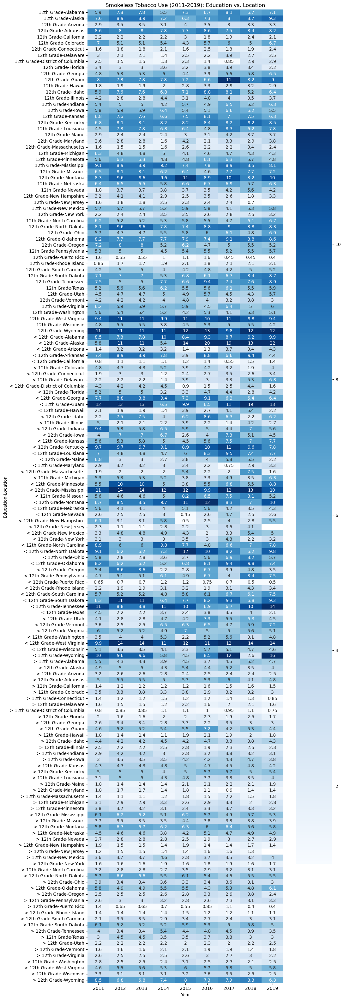

In [90]:
smokeless_ed = df_clean_education[(df_clean_education['Topic'] == "Smokeless Tobacco Use (Adults)") & 
                                 (df_clean_education['Measure'] == "Current Use")]

smokeless_ed_ct = pd.crosstab([smokeless_ed.Education, smokeless_ed.Location],
            smokeless_ed.Year, values=smokeless_ed.Data_Value, aggfunc=np.average)

fig, ax = plt.subplots(figsize=(10, 40))
sns.heatmap(smokeless_ed_ct, annot=True, robust=True, cmap="Blues")
ax.set_title('Smokeless Tobacco Use (2011-2019): Education vs. Location')

Text(0.5, 1.0, 'Cigarette Use (2011-2019): Education vs. Location')

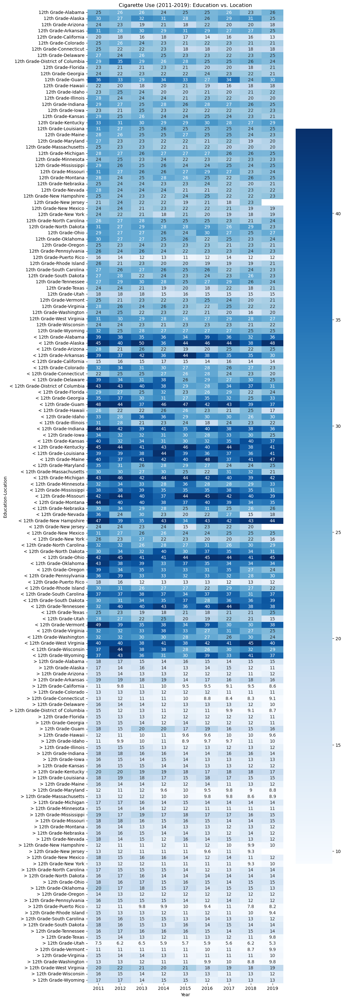

In [91]:
smoking_ed = df_clean_education[(df_clean_education['Topic'] == "Cigarette Use (Adults)") &
                               (df_clean_education['Measure'] == "Current Smoking")]

smoking_ed_ct = pd.crosstab([smoking_ed.Education, smoking_ed.Location], 
                           smoking_ed.Year, values=smoking_ed.Data_Value, aggfunc=np.average)

fig, ax = plt.subplots(figsize=(10, 40))
sns.heatmap(smoking_ed_ct, annot=True, robust=True, cmap="Blues")
ax.set_title('Cigarette Use (2011-2019): Education vs. Location')

Text(0.5, 1.0, 'E-Cigarette Use (2016-2018): Education vs. Location')

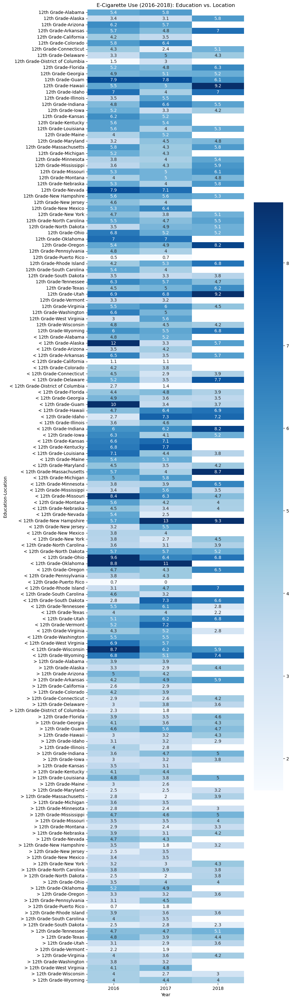

In [92]:
ecig_ed = df_clean_education[(df_clean_education['Topic'] == "E-Cigarette Use (Adults)") &
                            (df_clean_education['Measure'] == "Current Use")]

ecig_ed_ct = pd.crosstab([ecig_ed.Education, ecig_ed.Location], 
                        ecig_ed.Year, values=ecig_ed.Data_Value, aggfunc=np.average)

fig, ax = plt.subplots(figsize=(8,40))
sns.heatmap(ecig_ed_ct, annot=True, robust=True, cmap="Blues")
ax.set_title('E-Cigarette Use (2016-2018): Education vs. Location')

<h4>Quick Analysis:</h4>
<ul>
    <li><b>Less than 12th grade education group:</b> Highest usage across all tobacco product use. Increases in cigarette smoking in places like Alaska, Maine, Ohio, South Dakota, and Tennessee. Smokeless Tobacco use also saw increases in Alaska, Alabama, Tennessee, West Virginia, and Wyoming. Prominent E-Cigarette use inceases were found in places that generally saw declines in the other two categories (i.e. Delaware, Massachusetts, New Hampshire, Rhode Island, etc.)</li>
    <li><b>12th grade education group:</b> Generally declining pattern for cigarette smoking across all locations. However, smokeless tobacco and e-cigarette use did see an increase in several locations. Notable increases for smokeless tobacco use occurred in Alabama, Alaska, Guam, Kentucky, Louisiana, Montana, South Dakota, and Tennessee. Some of the largest increases for E-Cigarette use occurred in Hawaii, Oregona, and Utah.</li>
    <li><b>Greater than 12th grade education group:</b> Generally much lower percentages of smoking/smokeless tobacco/e-cigarette use. However, we see some interesting increases from Wyoming, Montanna, and Oklahoma from the smokeless tobacco use heatmap.</li>
</ul>

<h3>Location and Race:</h3>

Text(0.5, 1.0, 'Cigarette Use (2011-2019): Race vs. Location')

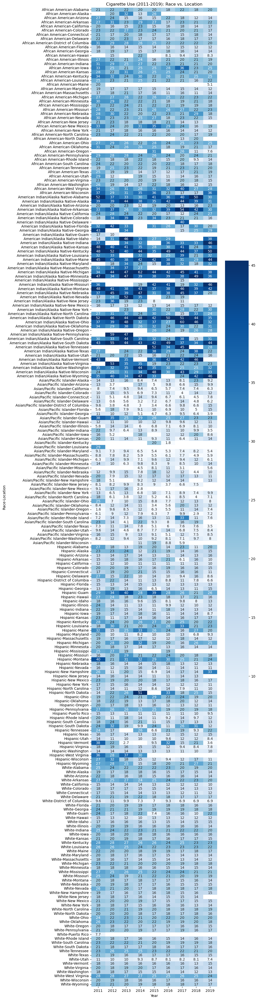

In [93]:
race_smoking = df_race[(df_race['Topic'] == "Cigarette Use (Adults)") &
                      (df_race['Measure'] == "Current Smoking")]

race_smoking_ct = pd.crosstab([race_smoking.Race, race_smoking.Location], 
                              race_smoking.Year, values=race_smoking.Data_Value, aggfunc=np.average)

fig, ax = plt.subplots(figsize=(8,50))
sns.heatmap(race_smoking_ct, annot=True, robust=True, cmap="Blues")
ax.set_title('Cigarette Use (2011-2019): Race vs. Location')

Text(0.5, 1.0, 'Smokeless Tobacco Use (2011-2019): Race vs. Location')

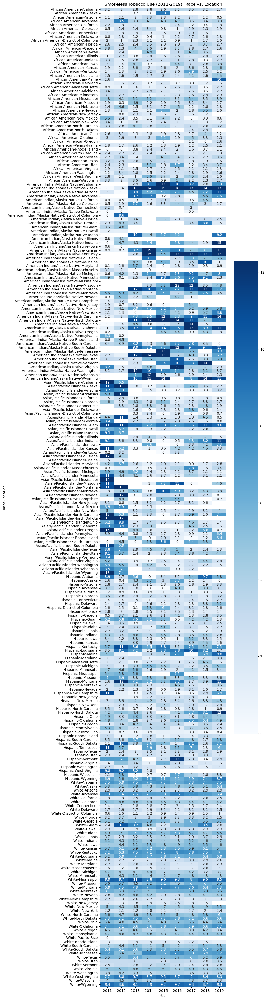

In [94]:
race_smokeless = df_race[(df_race['Topic'] == "Smokeless Tobacco Use (Adults)") &
                        (df_race['Measure'] == "Current Use")]

race_smokeless_ct = pd.crosstab([race_smokeless.Race, race_smokeless.Location], race_smokeless.Year, 
            values=race_smokeless.Data_Value, aggfunc=np.average)

fig, ax = plt.subplots(figsize=(8,50))
sns.heatmap(race_smokeless_ct, annot=True, robust=True, cmap="Blues")
ax.set_title('Smokeless Tobacco Use (2011-2019): Race vs. Location')

Text(0.5, 1.0, 'E-Cigarette Use (2016-2018): Race vs. Location')

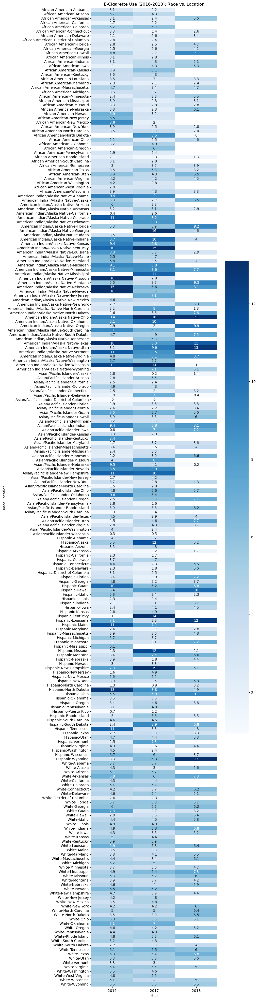

In [95]:
race_ecig = df_race[(df_race['Topic'] == "E-Cigarette Use (Adults)") &
                   (df_race['Measure'] == "Current Use")]

race_ecig_ct = pd.crosstab([race_ecig.Race, race_ecig.Location], race_ecig.Year, 
                           values=race_ecig.Data_Value, aggfunc=np.average)

fig, ax = plt.subplots(figsize=(8,50))
sns.heatmap(race_ecig_ct, annot=True, robust=True, cmap='Blues')
ax.set_title('E-Cigarette Use (2016-2018): Race vs. Location')

<h4>Quick Analysis:</h4>
<ul>
<li><b>Cigarette Use:</b> American Indian/Alaska Native population clearly stands out in this heatmap. Although the number of current smokers decreased generally across the board we do see a few increases in Indiana, Missouri, and Wyoming. The hispanic group also had a few outlier states with increases including Michigan and New Hampshire.</li>
<li><b>Smokeless Tobacco Use:</b> We notice that the American Indiana/Alaska Native population holds a majority of the increases we see in this heatmap in places like Alaska, Arizona, Indiana, Kansas, Kentucky, and North Carolina. However, we do see a lot of flat behavior within the White population across most states. The Hispanic group also holds a few outlier increases while mostly being in the decline.</li>
<li><b>E-Cigarette Use:</b> Usage across all racial groups in most of the states seems to be on an upward (and in some cases only slightly upward) trajectory.</li>
</ul>

<h3>Location and Gender:</h3>

Text(0.5, 1.0, 'Cigarette Use (2011-2019): Gender vs. Location')

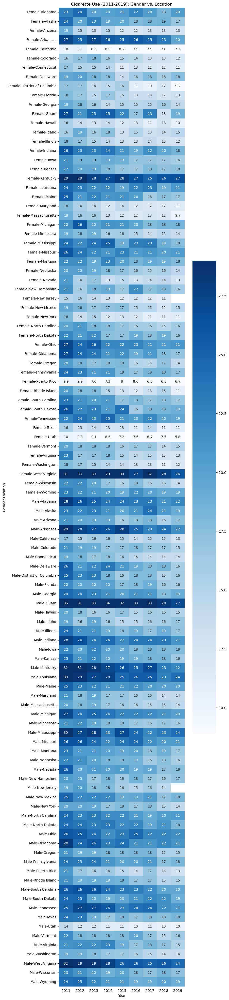

In [96]:
gen_smoking = df_gender[(df_gender['Topic'] == "Cigarette Use (Adults)") &
                       (df_gender['Measure'] == "Current Smoking")]

gen_smoking_ct = pd.crosstab([gen_smoking.Gender, gen_smoking.Location], gen_smoking.Year, 
                             values=gen_smoking.Data_Value, aggfunc=np.average)

fig, ax = plt.subplots(figsize=(8,50))
sns.heatmap(gen_smoking_ct, annot=True, robust=True, cmap="Blues")
ax.set_title('Cigarette Use (2011-2019): Gender vs. Location')

Text(0.5, 1.0, 'Smokeless Tobacco Use (2011-2019): Gender vs. Location')

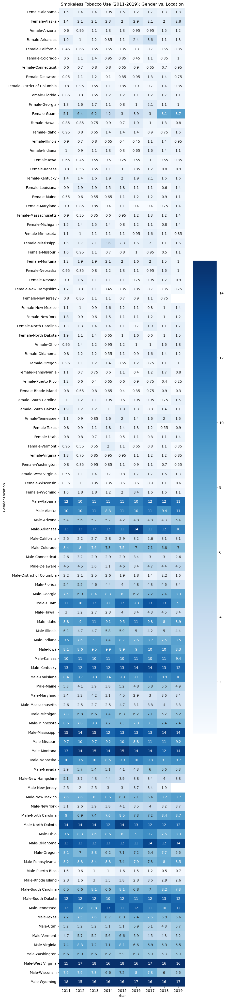

In [97]:
gen_smokeless = df_gender[(df_gender['Topic'] == "Smokeless Tobacco Use (Adults)") &
                         (df_gender['Measure'] == "Current Use")]

gen_smokeless_ct = pd.crosstab([gen_smokeless.Gender, gen_smokeless.Location], gen_smokeless.Year, 
                             values=gen_smokeless.Data_Value, aggfunc=np.average)

fig, ax = plt.subplots(figsize=(8,50))
sns.heatmap(gen_smokeless_ct, annot=True, robust=True, cmap="Blues")
ax.set_title('Smokeless Tobacco Use (2011-2019): Gender vs. Location')

Text(0.5, 1.0, 'E-Cigarette Use (2016-2018): Gender vs. Location')

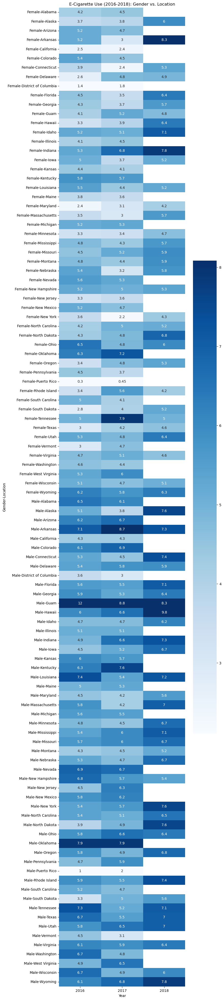

In [98]:
gen_ecig = df_gender[(df_gender['Topic'] == "E-Cigarette Use (Adults)") &
                    (df_gender['Measure'] == "Current Use")]

gen_ecig_ct = pd.crosstab([gen_ecig.Gender, gen_ecig.Location], gen_ecig.Year, 
                             values=gen_ecig.Data_Value, aggfunc=np.average)

fig, ax = plt.subplots(figsize=(8,50))
sns.heatmap(gen_ecig_ct, annot=True, robust=True, cmap="Blues")
ax.set_title('E-Cigarette Use (2016-2018): Gender vs. Location')

<h4>Quick Analysis:</h4>
<ul>
    <li><b>Cigarette Use Trends:</b> Females and Males across all states seem to show a decline in cigratte use.</li>
    <li><b>Smokeless Tobacco Use Trends:</b> Generally, females look to be on a very slight incline but mostly stay flat. However, two interesting spikes can be found in Alaska and Guam. Among males, we don't see any major spikes across locations but we do see a higher percentage of smokeless tobacco use and most of the use trends stay flat.</li>
    <li><b>E-Cigarette Use Trends:</b> We can very clearly see e-cigarette use is trending upwards for both males and females across almost all locations.</li>
</ul>

<h3>Location and Age:</h3>

Text(0.5, 1.0, 'Cigarette Use (2011-2019): Age vs. Location')

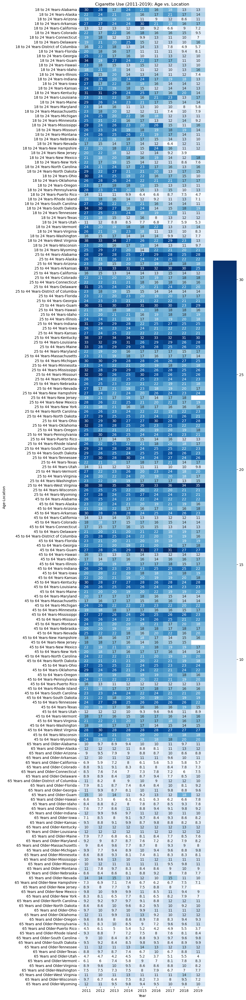

In [99]:
age_smoking = df_clean_age[(df_clean_age['Topic'] == "Cigarette Use (Adults)") &
                          (df_clean_age['Measure'] == "Current Smoking")]

age_smoking_ct = pd.crosstab([age_smoking.Age, age_smoking.Location], age_smoking.Year, 
                             values=age_smoking.Data_Value, aggfunc=np.average)

fig, ax = plt.subplots(figsize=(8,50))
sns.heatmap(age_smoking_ct, annot=True, robust=True, cmap="Blues")
ax.set_title('Cigarette Use (2011-2019): Age vs. Location')

Text(0.5, 1.0, 'Smokeless Tobacco Use (2011-2019): Age vs. Location')

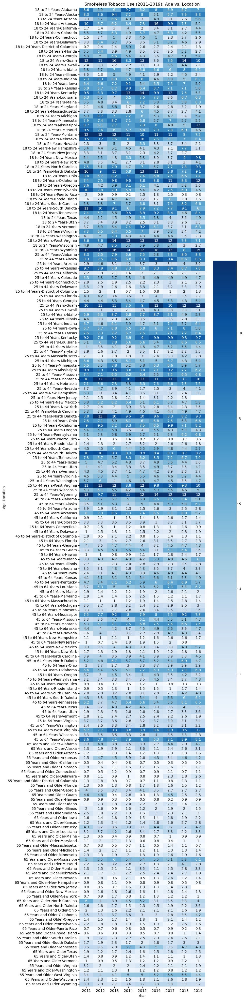

In [100]:
age_smokeless = df_clean_age[(df_clean_age['Topic'] == "Smokeless Tobacco Use (Adults)") &
                            (df_clean_age['Measure'] == "Current Use")]

age_smokeless_ct = pd.crosstab([age_smokeless.Age, age_smokeless.Location], age_smokeless.Year, 
                             values=age_smokeless.Data_Value, aggfunc=np.average)

fig, ax = plt.subplots(figsize=(8,50))
sns.heatmap(age_smokeless_ct, annot=True, robust=True, cmap="Blues")
ax.set_title('Smokeless Tobacco Use (2011-2019): Age vs. Location')

Text(0.5, 1.0, 'E-Cigarette Use (2016-2018): Age vs. Location')

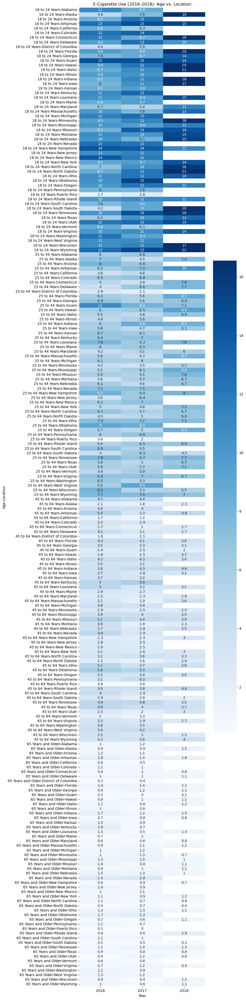

In [101]:
age_ecig = df_clean_age[(df_clean_age['Topic'] == "E-Cigarette Use (Adults)") &
                       (df_clean_age['Measure'] == "Current Use")]

age_ecig_ct = pd.crosstab([age_ecig.Age, age_ecig.Location], age_ecig.Year, 
                             values=age_ecig.Data_Value, aggfunc=np.average)

fig, ax = plt.subplots(figsize=(8,50))
sns.heatmap(age_ecig_ct, annot=True, robust=True, cmap="Blues")
ax.set_title('E-Cigarette Use (2016-2018): Age vs. Location')

<h4>Quic Analysis:</h4>
<ul>
    <li><b>Cigarette Use Trends:</b> The 25 to 44 year old age brakcet seems to hold the majority of current smokers. While we don't see any notable spikes we do notice a fair amount of flat trends across multiple states.</li>
    <li><b>Smokeless Tobacco Use Trends:</b> A few states actually stand out across multiple age groups. Guam, Wyoming, West Virginia, Mississippi, and Oklahoma all have relatively high smokeless tobacco use across age groups and we notice increases over the years in multiple age categories.</li>
    <li><b>E-Cigarette Use Trends:</b> Unsurprisingly, the 18 to 24 year old age group sees an almost unanimous increase in e-cigarette use by quite a large margin. We also see a mostly increasing trend from the 25 to 44 year old age bracket.</li>
</ul>

<h2>Step 6: Conclusions</h2>

<h3>Let's revisit our problem statement:</h3>
Since the introduction of the first ever federal government backed anti-smoking campaigns in 2012, have we seen a decline in smoking/tobacco use in the United States across all demographic groups? Can we identify at least one demographic group and/or one area in the country where smoking/tobacco use hasn’t declined or stagnated and offer possible solutions?

<h4>Now, let's attempt to answer each part of this:</h4>
<h5>Have we seen a decline in smoking/tobacco use in the US across all demographic groups?</h5>
<ul>
    <li>In general, we can see that there is a decline in cigarette smoking across the US. The data shows us that all locations, from a general view, seem to be decreasing in the number of current smokers.</li>
    <li>E-Cigarette and Smokeless tobacco use, however, seem to be mostly unaffected and in the case of e-cigs we can see that they're steadily on the rise with the limited data we have available.</li>
    <li>When we dig a little deeper into the demographic groups (Gender, Race, Education, etc.) we do see some differences among groups and so it would be untrue to say that all demographic groups have experienced the same level of decline (some have even seen an increase).</li>
</ul>
<h5>Can we identify at least one demogrpahic group where smoking/tobacco use hasn't declined or stagnated?</h5>
<ul>
    <li>We can actually point to quite a few demographic groups who didn't experience a decline and actually saw an increase in smoking/tobacco use.</li>
    <li><b>Gender:</b> We see that Males make up more of the tobacco using population. While they did tend to be on the decline with smoking, male use of smokeless tobacco products was virtually stagnant and their use of e-cigarettes was actually on the rise.</li>
    <li><b>Age:</b> With limited data we can see that the 18 to 24 year olds have significantly increased their e-cigarette usage. Additionally, that stagnation in smokeless tobacco use seems to carry over with several locations actually showing increases across multiple age groups.</li>
    <li><b>Race:</b> The American Indian/Alaska Native population stands out with increases in cigarette and smokeless tobacco use across multiple locations. The White population also had a lot of stagnation across locations regarding smokeless tobacco use.</li>
    <li><b>Education:</b> The less than 12th grade education group had noticeable increases in cigarette AND smokeless tobacco use in multiple locations (Alaska and Tennessee).</li> 
</ul>
<h5>Can we identify at least one area in the country where smoking/tobacco use hasn't declined or stagnated?</h5>
<ul>
    <li>Two locations showed increases in tobacco product use across all four demographic categories we looked at: <i>Alaska and Wyoming</i>.</li>
    <li>One location showed increases in tobacco product use in three different demographic categories: <i>Guam.</i></li>
    <li>Seven different locations had increases in tobacco product use across two differnet demographic categories: <i>Alabama, Indiana, Kentucky, Montana, Oklahoma, Tennessee, West Virginia.</i></li>
</ul>

<h3>Reccomendations:</h3>
<ul>
    <li>E-cigarette use is clearly a rising issue across the country and specifically with younger people. Focus new campaigns and new legislation on trying to curb this rising trend. Leveraging social media with ads and influencer partnerships to spread awareness of the dangers of e-cigarettes and vapes may yield some positive results as well.</li>
    <li>Smokeless tobacco use seems to be a steady constant in several locations and among several demographic groups. We know that the user groups seems to be dominated mostly by males that are white or american indian/alaska natives. The locations where we see increases also tend to be more rural. Education demographics suggest most users not even have a 12th grade education. Future ad campaigns should be targeted toward a blue collar audience and perhaps partern with professional outdoorsman or competitors from alternative sports like Rodeo (the official state sport of Wyoming).</li>
    <li>Continue on with the current anti-smoking campaign as the long term decline in smoking rates across the country are undeniable. While we can't definitively say that is because of the federal anti-smoking campaign, I would imagine it plays some role in the data we're seeing.</li>
</ul>